In [1]:
import sys
!{sys.executable} -m pip -q install palantir fa2


[notice] A new release of pip available: 22.3.1 -> 23.0.1
[notice] To update, run: pip install --upgrade pip


In [2]:
import warnings
warnings.filterwarnings("ignore")
from anndata import AnnData
import numpy as np
import pandas as pd
import scanpy as sc
import scFates as scf
import palantir
import matplotlib.pyplot as plt
sc.settings.verbosity = 3
sc.settings.logfile = sys.stdout
## fix palantir breaking down some plots
import seaborn
seaborn.reset_orig()
%matplotlib inline

sc.set_figure_params()
scf.set_figure_pubready()

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


In [4]:
import scvelo as scv

In [91]:
loom1 = scv.read("/mnt/g/Aric_data_fetal_human/125d_ct/velocyto/125d_ct.loom", cache = True)
loom2 = scv.read("/mnt/g/Aric_data_fetal_human/125d_pp/velocyto/125d_pp.loom", cache = True)
loom3 = scv.read("/mnt/g/Aric_data_fetal_human/scdata/fetal/59d/velocyto/59d.loom", cache = True)
loom4 = scv.read("/mnt/g/Aric_data_fetal_human/scdata/fetal/82d_ct/velocyto/82d_ct.loom", cache = True)
loom5 = scv.read("/mnt/g/Aric_data_fetal_human/scdata/fetal/82d_pp/velocyto/82d_pp.loom", cache = True)

... reading from cache file cache/mnt-g-Aric_data_fetal_human-125d_ct-velocyto-125d_ct.h5ad
... reading from cache file cache/mnt-g-Aric_data_fetal_human-125d_pp-velocyto-125d_pp.h5ad
... reading from cache file cache/mnt-g-Aric_data_fetal_human-scdata-fetal-59d-velocyto-59d.h5ad
... reading from cache file cache/mnt-g-Aric_data_fetal_human-scdata-fetal-82d_ct-velocyto-82d_ct.h5ad
... reading from cache file cache/mnt-g-Aric_data_fetal_human-scdata-fetal-82d_pp-velocyto-82d_pp.h5ad


In [6]:
FD82 = sc.read_h5ad('/mnt/c/Users/Emil/10X/FD82_labels.h5ad')

In [7]:
FD82_metadata = pd.read_csv(r"//mnt//c//Users//Emil//10X//FD82_metadata.csv")

In [8]:
FD82.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,percent.mt,S.Score,G2M.Score,Phase,RNA_snn_res.0.5,seurat_clusters,integrated_snn_res.0.5,labels
AAACATACTCTAGG-1_1,SeuratProject,1965.0,1021,21.933842,2.391858,-0.132757,-0.186726,G1,11,11,11,3
AAACATTGTACGAC-1_1,SeuratProject,1350.0,802,22.666667,0.666667,-0.089154,-0.140664,G1,9,7,7,3
AAACATTGTCGCAA-1_1,SeuratProject,2943.0,1392,24.770642,1.800883,-0.255574,-0.185088,G1,3,4,4,5
AAACCGTGATCTTC-1_1,SeuratProject,1183.0,711,27.218935,3.972950,0.106913,0.104555,S,1,1,1,6
AAACGCACCCTTGC-1_1,SeuratProject,1997.0,985,29.644467,2.403605,0.171290,0.264497,G2M,1,1,1,6
...,...,...,...,...,...,...,...,...,...,...,...,...
TTTAGGCTCGAATC-1_2,SeuratProject,3209.0,1463,21.159240,2.742287,0.230205,0.358893,G2M,3,1,1,6
TTTAGGCTGATAAG-1_2,SeuratProject,2413.0,1087,29.009532,2.403647,-0.190330,-0.118814,G1,2,3,3,6
TTTAGGCTTTGACG-1_2,SeuratProject,1573.0,837,16.083916,4.958678,-0.046158,-0.131676,G1,1,6,6,1
TTTATCCTTGCTCC-1_2,SeuratProject,2112.0,880,29.971591,1.278409,-0.133877,-0.188511,G1,1,5,5,3


In [9]:
FD82_metadata = FD82_metadata.rename(columns = {'Unnamed: 0':'CellID'})

In [10]:
FD82_metadata = FD82_metadata.set_index('CellID')

In [11]:
FD82.obs['labels1'] = FD82_metadata['labels']

In [12]:
FD82.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,percent.mt,S.Score,G2M.Score,Phase,RNA_snn_res.0.5,seurat_clusters,integrated_snn_res.0.5,labels,labels1
AAACATACTCTAGG-1_1,SeuratProject,1965.0,1021,21.933842,2.391858,-0.132757,-0.186726,G1,11,11,11,3,Amacrine
AAACATTGTACGAC-1_1,SeuratProject,1350.0,802,22.666667,0.666667,-0.089154,-0.140664,G1,9,7,7,3,Amacrine
AAACATTGTCGCAA-1_1,SeuratProject,2943.0,1392,24.770642,1.800883,-0.255574,-0.185088,G1,3,4,4,5,RGC
AAACCGTGATCTTC-1_1,SeuratProject,1183.0,711,27.218935,3.972950,0.106913,0.104555,S,1,1,1,6,Progenitors
AAACGCACCCTTGC-1_1,SeuratProject,1997.0,985,29.644467,2.403605,0.171290,0.264497,G2M,1,1,1,6,Progenitors
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTAGGCTCGAATC-1_2,SeuratProject,3209.0,1463,21.159240,2.742287,0.230205,0.358893,G2M,3,1,1,6,Progenitors
TTTAGGCTGATAAG-1_2,SeuratProject,2413.0,1087,29.009532,2.403647,-0.190330,-0.118814,G1,2,3,3,6,Progenitors
TTTAGGCTTTGACG-1_2,SeuratProject,1573.0,837,16.083916,4.958678,-0.046158,-0.131676,G1,1,6,6,1,Horizontal
TTTATCCTTGCTCC-1_2,SeuratProject,2112.0,880,29.971591,1.278409,-0.133877,-0.188511,G1,1,5,5,3,Amacrine


In [13]:
FD59 = sc.read_h5ad('/mnt/c/Users/Emil/10X/FD59_labels.h5ad')
FD125 = sc.read_h5ad('/mnt/c/Users/Emil/10X/FD125_labels.h5ad')

In [14]:
FD59_metadata = pd.read_csv(r"//mnt//c//Users//Emil//10X//FD59_metadata.csv")
FD125_metadata = pd.read_csv(r"//mnt//c//Users//Emil//10X//FD125_metadata.csv")

In [15]:
FD59_metadata = FD59_metadata.rename(columns = {'Unnamed: 0':'CellID'})
FD125_metadata = FD125_metadata.rename(columns = {'Unnamed: 0':'CellID'})
FD59_metadata = FD59_metadata.set_index('CellID')
FD125_metadata = FD125_metadata.set_index('CellID')
FD59.obs['labels1'] = FD59_metadata['labels']
FD125.obs['labels1'] = FD125_metadata['labels']

In [16]:
FD59.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,percent.mt,RNA_snn_res.0.5,seurat_clusters,labels,labels1
AAACATACGAGGCA-1,0,1976.0,1042,27.277328,1.012146,3,3,3,Progenitors
AAACATACTTCCAT-1,0,7729.0,3010,27.105706,3.402769,1,1,2,T1A
AAACATACTTTCAC-1,0,1735.0,918,24.034582,1.152738,4,4,4,T1B
AAACATTGACCTGA-1,0,2323.0,1140,22.987516,0.516573,6,6,1,RGC
AAACCGTGAGAACA-1,0,2751.0,1214,29.989095,1.999273,8,8,3,Progenitors
...,...,...,...,...,...,...,...,...,...
TTTGACTGCAATCG-1,0,5390.0,2121,25.417440,3.024119,1,1,2,T1A
TTTGACTGGGGACA-1,0,2186.0,1091,22.140897,2.287283,6,6,1,RGC
TTTGACTGTGGTAC-1,0,2190.0,1104,21.232877,1.826484,6,6,1,RGC
TTTGCATGAATCGC-1,0,1405.0,730,24.270463,0.854093,2,2,1,RGC


In [17]:
FD125.obs

,nCount_RNA,nFeature_RNA,orig.ident,percent.rb,percent.mt,S.Score,G2M.Score,Phase,RNA_snn_res.0.5,seurat_clusters,integrated_snn_res.0.5,labels,labels1
AAACATACACGCTA-1_1,1730.0,1027,SeuratProject,20.173410,4.161850,-0.062609,-0.025931,G1,0,0,0,0,PR
AAACATTGACCTCC-1_1,1213.0,798,SeuratProject,18.466612,1.566364,-0.075935,0.035660,G2M,2,3,3,0,PR
AAACATTGCAAAGA-1_1,2283.0,1209,SeuratProject,23.127464,2.847131,-0.101744,-0.101794,G1,3,6,6,4,RGC
AAACATTGCTACGA-1_1,1300.0,822,SeuratProject,12.076923,5.615385,-0.052679,-0.060002,G1,3,6,6,4,RGC
AAACATTGTCTTCA-1_1,2263.0,1306,SeuratProject,18.250110,4.595669,-0.080241,-0.113605,G1,9,7,7,0,PR
...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGGCTTAG-1_2,1609.0,865,SeuratProject,28.899938,2.299565,-0.171535,-0.081043,G1,1,0,0,0,PR
TTTGCATGACAGCT-1_2,1132.0,685,SeuratProject,27.826855,2.385159,-0.089169,-0.093966,G1,1,0,0,0,PR
TTTGCATGCAGGAG-1_2,1545.0,862,SeuratProject,26.213592,1.229773,0.132508,0.469296,G2M,0,1,1,1,Progenitors
TTTGCATGCGAACT-1_2,2412.0,1254,SeuratProject,25.870647,1.409619,0.284824,-0.110046,S,0,1,1,1,Progenitors


In [18]:
FDs = FD59.concatenate(FD82,FD125)

In [22]:
FD59.obs['stage'] = 'FD59'

In [23]:
FD59.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,percent.mt,RNA_snn_res.0.5,seurat_clusters,labels,labels1,stage
AAACATACGAGGCA-1,0,1976.0,1042,27.277328,1.012146,3,3,3,Progenitors,FD59
AAACATACTTCCAT-1,0,7729.0,3010,27.105706,3.402769,1,1,2,T1A,FD59
AAACATACTTTCAC-1,0,1735.0,918,24.034582,1.152738,4,4,4,T1B,FD59
AAACATTGACCTGA-1,0,2323.0,1140,22.987516,0.516573,6,6,1,RGC,FD59
AAACCGTGAGAACA-1,0,2751.0,1214,29.989095,1.999273,8,8,3,Progenitors,FD59
...,...,...,...,...,...,...,...,...,...,...
TTTGACTGCAATCG-1,0,5390.0,2121,25.417440,3.024119,1,1,2,T1A,FD59
TTTGACTGGGGACA-1,0,2186.0,1091,22.140897,2.287283,6,6,1,RGC,FD59
TTTGACTGTGGTAC-1,0,2190.0,1104,21.232877,1.826484,6,6,1,RGC,FD59
TTTGCATGAATCGC-1,0,1405.0,730,24.270463,0.854093,2,2,1,RGC,FD59


In [24]:
FD82.obs['stage'] = 'FD82'
FD125.obs['stage'] = 'FD125'

In [25]:
FDs = FD59.concatenate(FD82,FD125)

In [26]:
FDs.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,percent.mt,RNA_snn_res.0.5,seurat_clusters,labels,labels1,stage,S.Score,G2M.Score,Phase,integrated_snn_res.0.5,batch
AAACATACGAGGCA-1-0,0,1976.0,1042,27.277328,1.012146,3,3,3,Progenitors,FD59,NaN,NaN,NaN,NaN,0
AAACATACTTCCAT-1-0,0,7729.0,3010,27.105706,3.402769,1,1,2,T1A,FD59,NaN,NaN,NaN,NaN,0
AAACATACTTTCAC-1-0,0,1735.0,918,24.034582,1.152738,4,4,4,T1B,FD59,NaN,NaN,NaN,NaN,0
AAACATTGACCTGA-1-0,0,2323.0,1140,22.987516,0.516573,6,6,1,RGC,FD59,NaN,NaN,NaN,NaN,0
AAACCGTGAGAACA-1-0,0,2751.0,1214,29.989095,1.999273,8,8,3,Progenitors,FD59,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGGCTTAG-1_2-2,SeuratProject,1609.0,865,28.899938,2.299565,1,0,0,PR,FD125,-0.171535,-0.081043,G1,0.0,2
TTTGCATGACAGCT-1_2-2,SeuratProject,1132.0,685,27.826855,2.385159,1,0,0,PR,FD125,-0.089169,-0.093966,G1,0.0,2
TTTGCATGCAGGAG-1_2-2,SeuratProject,1545.0,862,26.213592,1.229773,0,1,1,Progenitors,FD125,0.132508,0.469296,G2M,1.0,2
TTTGCATGCGAACT-1_2-2,SeuratProject,2412.0,1254,25.870647,1.409619,0,1,1,Progenitors,FD125,0.284824,-0.110046,S,1.0,2


In [27]:
sc.pp.pca(FDs)
pca_projections = pd.DataFrame(FDs.obsm["X_pca"],index=FDs.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
FDs.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(FDs,n_neighbors=30,use_rep="X_palantir")
FDs.obsm["X_pca2d"]=FDs.obsm["X_pca"][:,:2]
sc.tl.draw_graph(FDs,init_pos='X_pca2d')

computing PCA
    with n_comps=50
    finished (0:00:22)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:25)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:02)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:01:51)


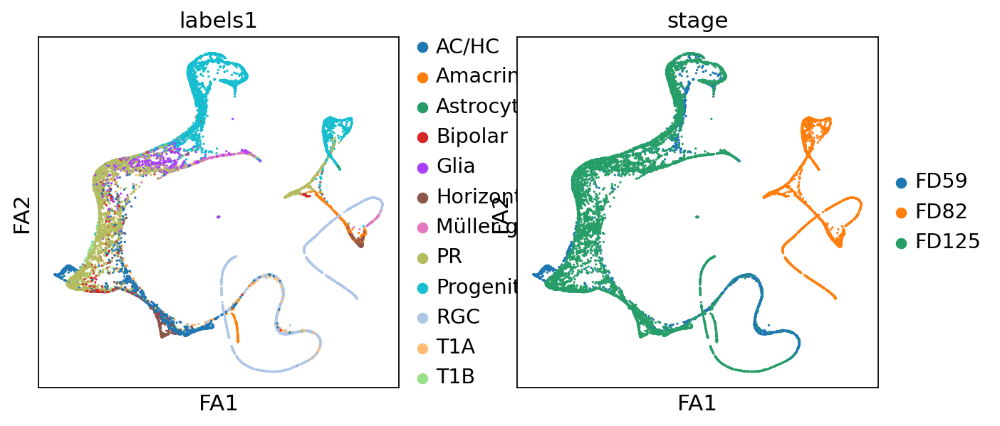

In [36]:
sc.pl.draw_graph(FDs,color=['labels1', 'stage'])

In [29]:
FDs.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,percent.mt,RNA_snn_res.0.5,seurat_clusters,labels,labels1,stage,S.Score,G2M.Score,Phase,integrated_snn_res.0.5,batch
AAACATACGAGGCA-1-0,0,1976.0,1042,27.277328,1.012146,3,3,3,Progenitors,FD59,NaN,NaN,NaN,NaN,0
AAACATACTTCCAT-1-0,0,7729.0,3010,27.105706,3.402769,1,1,2,T1A,FD59,NaN,NaN,NaN,NaN,0
AAACATACTTTCAC-1-0,0,1735.0,918,24.034582,1.152738,4,4,4,T1B,FD59,NaN,NaN,NaN,NaN,0
AAACATTGACCTGA-1-0,0,2323.0,1140,22.987516,0.516573,6,6,1,RGC,FD59,NaN,NaN,NaN,NaN,0
AAACCGTGAGAACA-1-0,0,2751.0,1214,29.989095,1.999273,8,8,3,Progenitors,FD59,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGGCTTAG-1_2-2,SeuratProject,1609.0,865,28.899938,2.299565,1,0,0,PR,FD125,-0.171535,-0.081043,G1,0.0,2
TTTGCATGACAGCT-1_2-2,SeuratProject,1132.0,685,27.826855,2.385159,1,0,0,PR,FD125,-0.089169,-0.093966,G1,0.0,2
TTTGCATGCAGGAG-1_2-2,SeuratProject,1545.0,862,26.213592,1.229773,0,1,1,Progenitors,FD125,0.132508,0.469296,G2M,1.0,2
TTTGCATGCGAACT-1_2-2,SeuratProject,2412.0,1254,25.870647,1.409619,0,1,1,Progenitors,FD125,0.284824,-0.110046,S,1.0,2


In [30]:
def cluster_small_multiples_cartoon(
    adata, clust_key, size=40, frameon=False, legend_loc=None, **kwargs
):
    tmp = adata.copy()

    for i, clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype("category")
        tmp.uns[clust + "_colors"] = ["#d3d3d3", adata.uns[clust_key + "_colors"][i]]

    with rc_context({'figure.figsize': (5, 5)}):
        sc.pl.draw_graph(
            tmp,
            groups=tmp.obs[clust].cat.categories[1:].values,
            color=adata.obs[clust_key].cat.categories.tolist(),
            size=size,
            add_outline=True,
            legend_fontsize=12, legend_fontoutline=2,
            frameon=True,
            legend_loc=legend_loc, outline_width = [0.6,0.1],
            **kwargs,
        )

In [33]:
def cluster_small_multiples(adata, clust_key, size=60, frameon=False, legend_loc=None, **kwargs):
    tmp = adata.copy()

    for i,clust in enumerate(adata.obs[clust_key].cat.categories):
        tmp.obs[clust] = adata.obs[clust_key].isin([clust]).astype('category')
        tmp.uns[clust+'_colors'] = ['#d3d3d3', adata.uns[clust_key+'_colors'][i]]

    sc.pl.draw_graph(tmp, groups=tmp.obs[clust].cat.categories[1:].values, color=adata.obs[clust_key].cat.categories.tolist(), size=size, frameon=frameon, legend_loc=legend_loc, **kwargs)

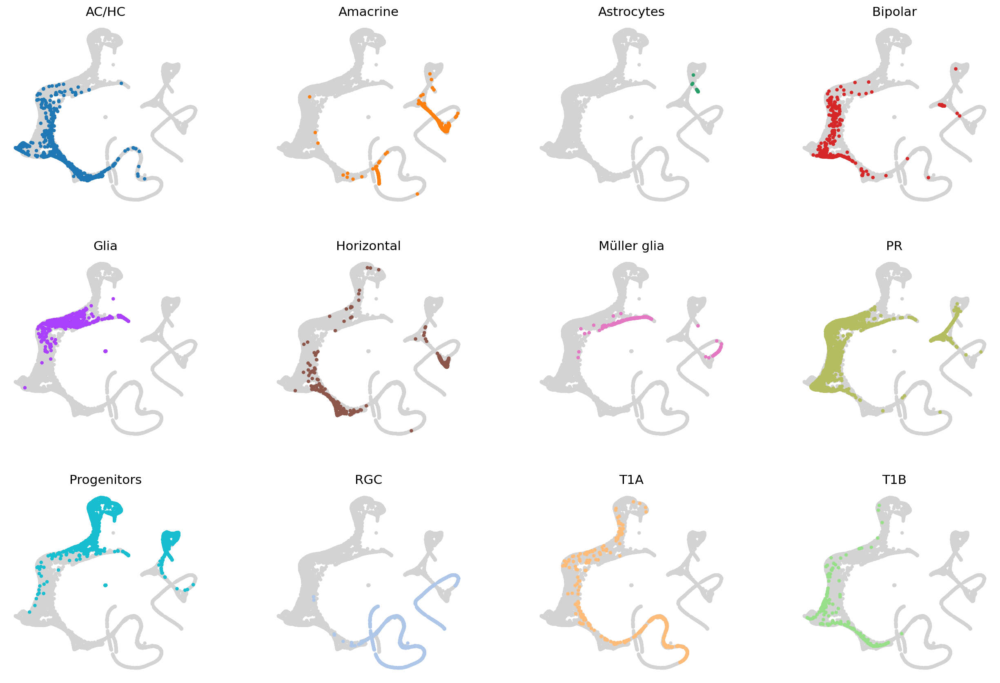

In [35]:
cluster_small_multiples(FDs, clust_key = 'labels1')

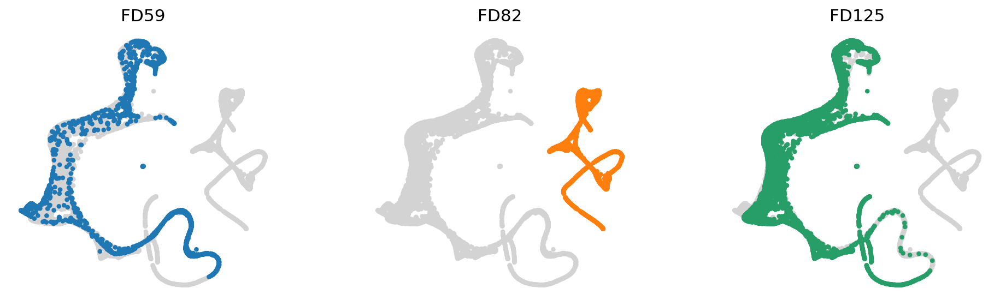

In [37]:
cluster_small_multiples(FDs, clust_key = 'stage')

In [38]:
ldata = scv.read('/mnt/c/Users/Emil/10X/FD_adata_ldata.loom', cache = True)

... reading from cache file cache/mnt-c-Users-Emil-10X-FD_adata_ldata.h5ad


In [39]:
FDs_loom = scv.utils.merge(FDs, ldata)

In [40]:
FDs.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,percent.mt,RNA_snn_res.0.5,seurat_clusters,labels,labels1,stage,S.Score,G2M.Score,Phase,integrated_snn_res.0.5,batch,sample_batch
AAACATACGAGGCA,0,1976.0,1042,27.277328,1.012146,3,3,3,Progenitors,FD59,NaN,NaN,NaN,NaN,0,-1-0
AAACATACTTCCAT,0,7729.0,3010,27.105706,3.402769,1,1,2,T1A,FD59,NaN,NaN,NaN,NaN,0,-1-0
AAACATACTTTCAC,0,1735.0,918,24.034582,1.152738,4,4,4,T1B,FD59,NaN,NaN,NaN,NaN,0,-1-0
AAACATTGACCTGA,0,2323.0,1140,22.987516,0.516573,6,6,1,RGC,FD59,NaN,NaN,NaN,NaN,0,-1-0
AAACCGTGAGAACA,0,2751.0,1214,29.989095,1.999273,8,8,3,Progenitors,FD59,NaN,NaN,NaN,NaN,0,-1-0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGGCTTAG,SeuratProject,1609.0,865,28.899938,2.299565,1,0,0,PR,FD125,-0.171535,-0.081043,G1,0.0,2,-1_2-2
TTTGCATGACAGCT,SeuratProject,1132.0,685,27.826855,2.385159,1,0,0,PR,FD125,-0.089169,-0.093966,G1,0.0,2,-1_2-2
TTTGCATGCAGGAG,SeuratProject,1545.0,862,26.213592,1.229773,0,1,1,Progenitors,FD125,0.132508,0.469296,G2M,1.0,2,-1_2-2
TTTGCATGCGAACT,SeuratProject,2412.0,1254,25.870647,1.409619,0,1,1,Progenitors,FD125,0.284824,-0.110046,S,1.0,2,-1_2-2


In [41]:
FDs_loom.obs

,orig.ident,nCount_RNA,nFeature_RNA,percent.rb,percent.mt,RNA_snn_res.0.5,seurat_clusters,labels,labels1,stage,...,Phase,integrated_snn_res.0.5,batch,sample_batch,Clusters,_X,_Y,initial_size_spliced,initial_size_unspliced,initial_size
AAACATACGAGGCA,0,1976.0,1042,27.277328,1.012146,3,3,3,Progenitors,FD59,...,NaN,NaN,0,-1-0,6,31.952299,-4.982734,160,50,160.0
AAACATACTTCCAT,0,7729.0,3010,27.105706,3.402769,1,1,2,T1A,FD59,...,NaN,NaN,0,-1-0,8,16.908585,-6.551699,5,5,5.0
AAACATACTTTCAC,0,1735.0,918,24.034582,1.152738,4,4,4,T1B,FD59,...,NaN,NaN,0,-1-0,2,-25.597639,-13.431974,198,50,198.0
AAACATTGACCTGA,0,2323.0,1140,22.987516,0.516573,6,6,1,RGC,FD59,...,NaN,NaN,0,-1-0,7,-3.144438,8.798876,149,45,149.0
AAACCGTGAGAACA,0,2751.0,1214,29.989095,1.999273,8,8,3,Progenitors,FD59,...,NaN,NaN,0,-1-0,6,38.513256,-10.901864,158,22,158.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGACTGGCTTAG,SeuratProject,1609.0,865,28.899938,2.299565,1,0,0,PR,FD125,...,G1,0.0,2,-1_2-2,2,-41.724892,-18.232719,151,71,151.0
TTTGCATGACAGCT,SeuratProject,1132.0,685,27.826855,2.385159,1,0,0,PR,FD125,...,G1,0.0,2,-1_2-2,2,-28.625381,-25.878700,195,80,195.0
TTTGCATGCAGGAG,SeuratProject,1545.0,862,26.213592,1.229773,0,1,1,Progenitors,FD125,...,G2M,1.0,2,-1_2-2,0,-9.360089,-12.896761,210,52,210.0
TTTGCATGCGAACT,SeuratProject,2412.0,1254,25.870647,1.409619,0,1,1,Progenitors,FD125,...,S,1.0,2,-1_2-2,14,44.119270,-24.373066,142,41,142.0


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial
findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


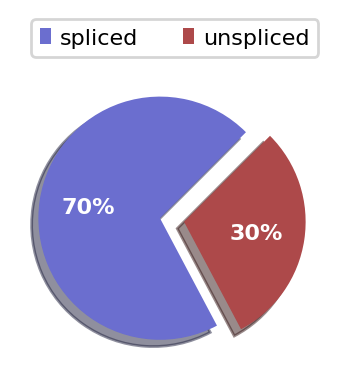

In [42]:
scv.pl.proportions(FDs_loom)

In [43]:
scv.pp.filter_and_normalize(FDs_loom, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(FDs_loom, n_pcs=30, n_neighbors=30)

Filtered out 678 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [44]:
scv.tl.velocity(FDs_loom)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [45]:
scv.tl.velocity_graph(FDs_loom)

computing velocity graph (using 1/12 cores)


  0%|          | 0/13915 [00:00<?, ?cells/s]

    finished (0:00:14) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:04) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


findfont: Font family ['sans-serif'] not found. Falling back to DejaVu Sans.
findfont: Generic family 'sans-serif' not found because none of the following families were found: Arial


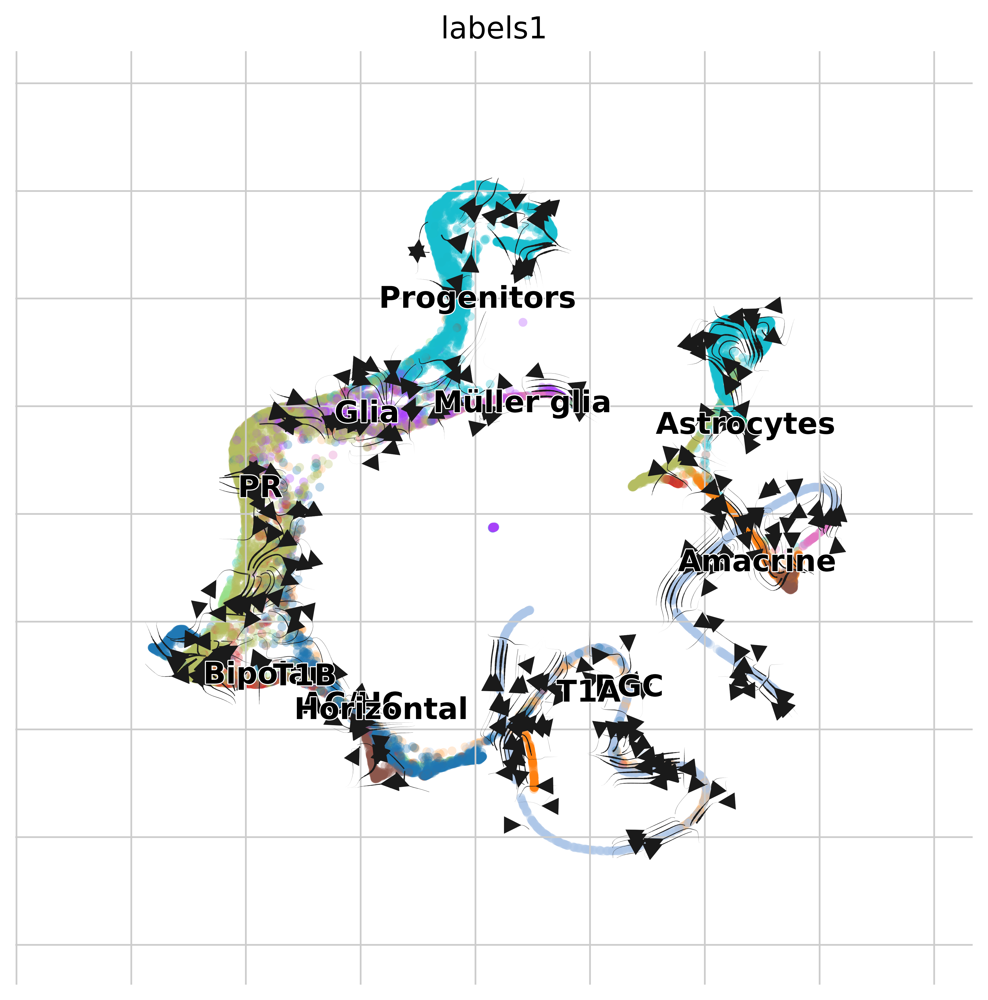

In [46]:
scv.pl.velocity_embedding_stream(FDs_loom, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

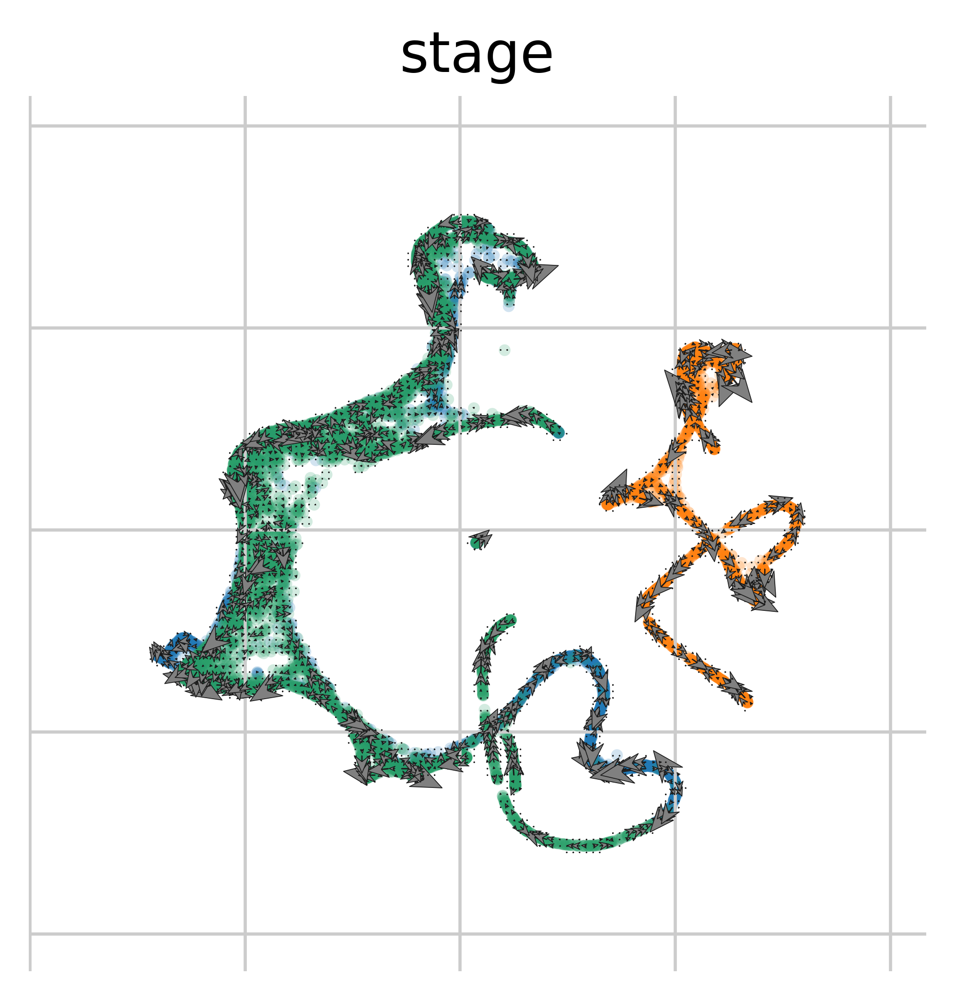

In [47]:
scv.pl.velocity_embedding_grid(FDs_loom, basis='draw_graph_fa', color = 'stage', dpi = 300, add_margin = 0.2, figsize = (4,4), arrow_length = 4, arrow_size = 6, density = 2)

In [48]:
FD59 = FDs[FDs.obs['stage'].isin(['FD59'])]
FD82 = FDs[FDs.obs['stage'].isin(['FD82'])]
FD125 = FDs[FDs.obs['stage'].isin(['FD125'])]

In [49]:
sc.pp.pca(FD59)
pca_projections = pd.DataFrame(FD59.obsm["X_pca"],index=FD59.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
FD59.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(FD59,n_neighbors=30,use_rep="X_palantir")
FD59.obsm["X_pca2d"]=FD59.obsm["X_pca"][:,:2]
sc.tl.draw_graph(FD59,init_pos='X_pca2d')

computing PCA
    with n_comps=50
    finished (0:00:02)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:13)


In [50]:
sc.pp.pca(FD82)
pca_projections = pd.DataFrame(FD82.obsm["X_pca"],index=FD82.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
FD82.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(FD82,n_neighbors=30,use_rep="X_palantir")
FD82.obsm["X_pca2d"]=FD82.obsm["X_pca"][:,:2]
sc.tl.draw_graph(FD82,init_pos='X_pca2d')

computing PCA
    with n_comps=50
    finished (0:00:00)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:15)


In [51]:
sc.pp.pca(FD125)
pca_projections = pd.DataFrame(FD125.obsm["X_pca"],index=FD125.obs_names)
dm_res = palantir.utils.run_diffusion_maps(pca_projections)
ms_data = palantir.utils.determine_multiscale_space(dm_res,n_eigs=4)
FD125.obsm["X_palantir"]=ms_data.values
sc.pp.neighbors(FD125,n_neighbors=30,use_rep="X_palantir")
FD125.obsm["X_pca2d"]=FD125.obsm["X_pca"][:,:2]
sc.tl.draw_graph(FD125,init_pos='X_pca2d')

computing PCA
    with n_comps=50
    finished (0:00:10)
Determing nearest neighbor graph...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
drawing single-cell graph using layout 'fa'
    finished: added
    'X_draw_graph_fa', graph_drawing coordinates (adata.obsm) (0:00:58)


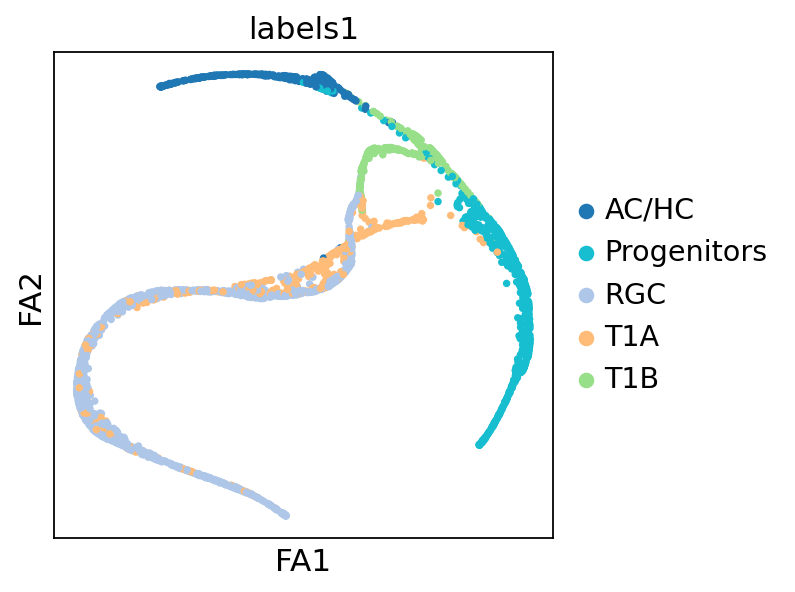

In [52]:
sc.pl.draw_graph(FD59,color=['labels1'])

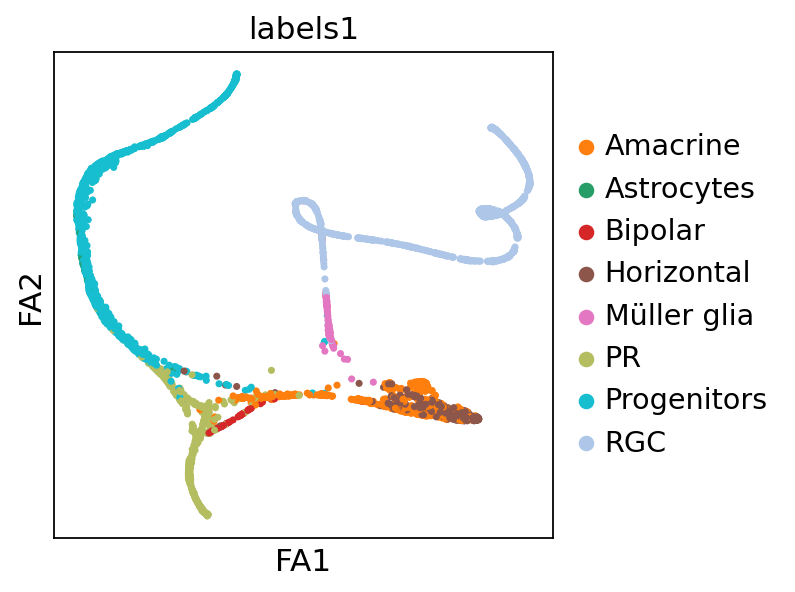

In [53]:
sc.pl.draw_graph(FD82,color=['labels1'])

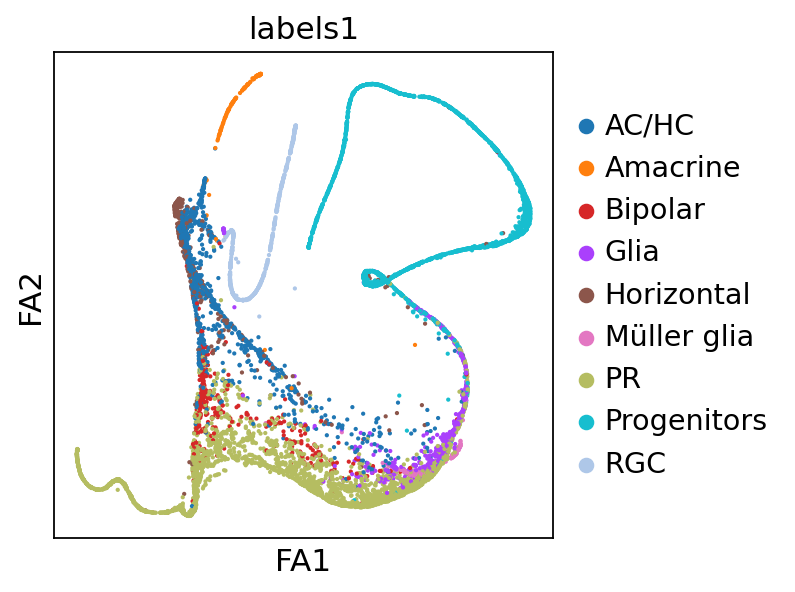

In [54]:
sc.pl.draw_graph(FD125,color=['labels1'])

In [56]:
FD59_loom = scv.utils.merge(FD59, loom3)

FD125_loom = scv.utils.merge(FD125, loom1,loom2)

In [99]:
FD82_loom = scv.utils.merge(FD82, loom4, loom5)

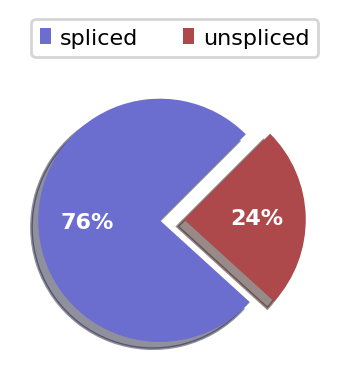

In [58]:
scv.pl.proportions(FD59_loom)

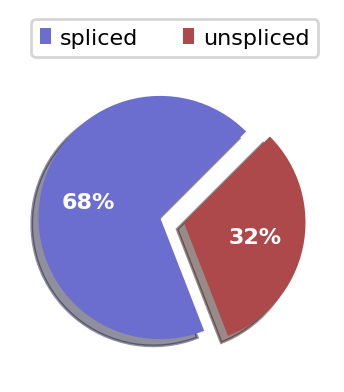

In [100]:
scv.pl.proportions(FD82_loom)

In [94]:
FD82_loom

AnnData object with n_obs × n_vars = 2263 × 737
    obs: 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'percent.rb', 'percent.mt', 'RNA_snn_res.0.5', 'seurat_clusters', 'labels', 'labels1', 'stage', 'S.Score', 'G2M.Score', 'Phase', 'integrated_snn_res.0.5', 'batch', 'sample_batch', 'Clusters', '_X', '_Y', 'initial_size_spliced', 'initial_size_unspliced', 'initial_size'
    var: 'vst.mean-0', 'vst.variance-0', 'vst.variance.expected-0', 'vst.variance.standardized-0', 'vst.variable-0', 'features-1', 'features-2', 'Accession', 'Chromosome', 'End', 'Start', 'Strand'
    uns: 'pca', 'neighbors', 'draw_graph', 'labels1_colors', 'stage_colors'
    obsm: 'X_tsne', 'X_umap', 'X_pca', 'X_palantir', 'X_pca2d', 'X_draw_graph_fa'
    varm: 'PCs'
    layers: 'ambiguous', 'matrix', 'spliced', 'unspliced'
    obsp: 'distances', 'connectivities'

In [95]:
sc.pp.neighbors(FD82_loom)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


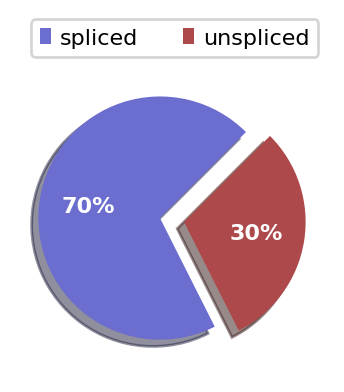

In [60]:
scv.pl.proportions(FD125_loom)

In [71]:
scv.pp.filter_and_normalize(FD59_loom, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(FD59_loom, n_pcs=30, n_neighbors=30)

scv.pp.filter_and_normalize(FD125_loom, min_shared_counts=20, n_top_genes=2000)
scv.pp.moments(FD125_loom, n_pcs=30, n_neighbors=30)

Normalized count data: unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
Normalized count data: unspliced.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Filtered out 731 genes that are detected 20 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
Filtered out 1 genes that are detected 20 counts (shared).
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00

In [101]:
scv.pp.filter_and_normalize(FD82_loom, min_shared_counts=5, n_top_genes=4000)
scv.pp.moments(FD82_loom, n_pcs=30, n_neighbors=30)

Filtered out 697 genes that are detected 5 counts (shared).
Normalized count data: spliced, unspliced.
Skip filtering by dispersion since number of variables are less than `n_top_genes`.
or is corrupted (e.g. due to subsetting). Consider recomputing with `pp.neighbors`.
computing moments based on connectivities
    finished (0:00:00) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)


In [97]:
scv.tl.velocity(FD59_loom)


computing velocities
The correlation threshold has been reduced to -0.1841.
Please be cautious when interpreting results.
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [102]:
scv.tl.velocity(FD82_loom)


computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [103]:

scv.tl.velocity(FD125_loom)

computing velocities
    finished (0:00:00) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)


In [104]:
scv.tl.velocity_graph(FD59_loom)

computing velocity graph (using 1/12 cores)


  0%|          | 0/2656 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [77]:
sc.pp.neighbors(FD125_loom)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [105]:
scv.tl.velocity_graph(FD125_loom)

computing velocity graph (using 1/12 cores)


  0%|          | 0/3356 [00:00<?, ?cells/s]

    finished (0:00:03) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


In [107]:
sc.pp.neighbors(FD82_loom)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)


In [108]:
scv.tl.velocity_graph(FD82_loom)

computing velocity graph (using 1/12 cores)


  0%|          | 0/2263 [00:00<?, ?cells/s]

    finished (0:00:02) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)


computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


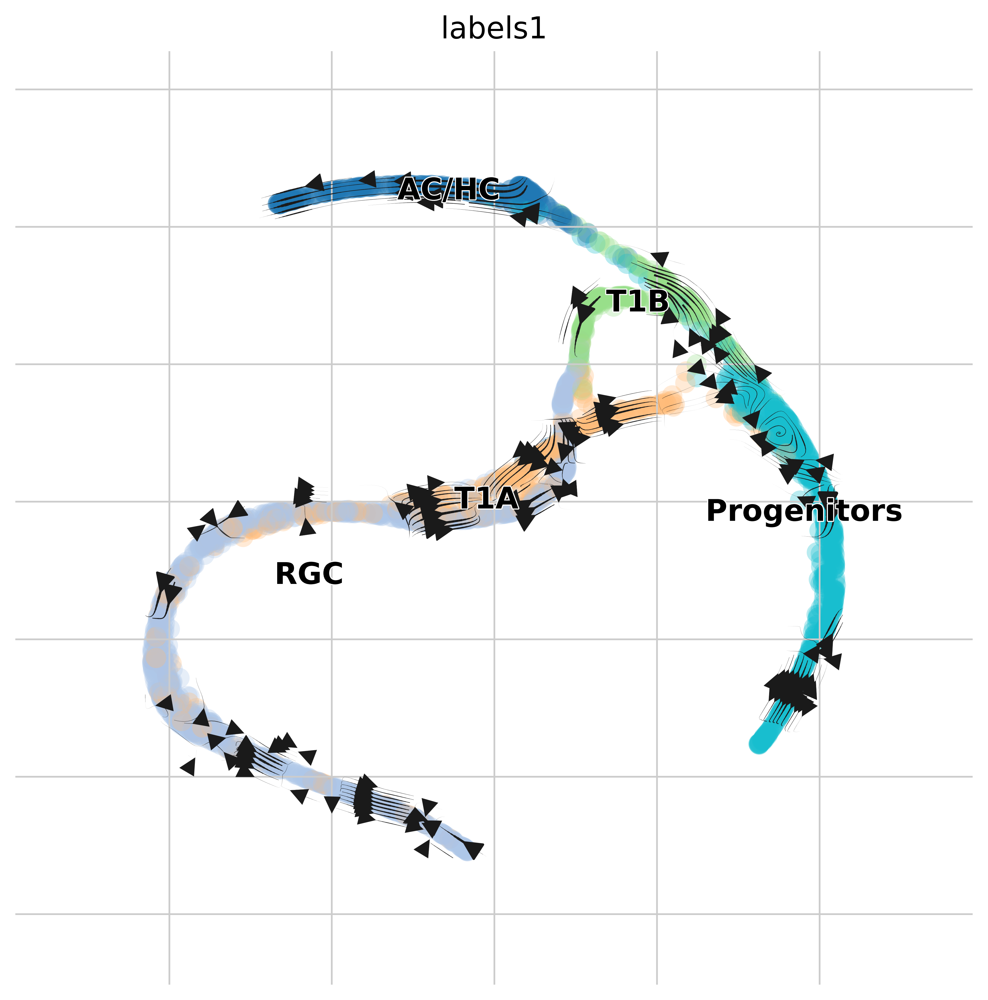

In [109]:
scv.pl.velocity_embedding_stream(FD59_loom, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

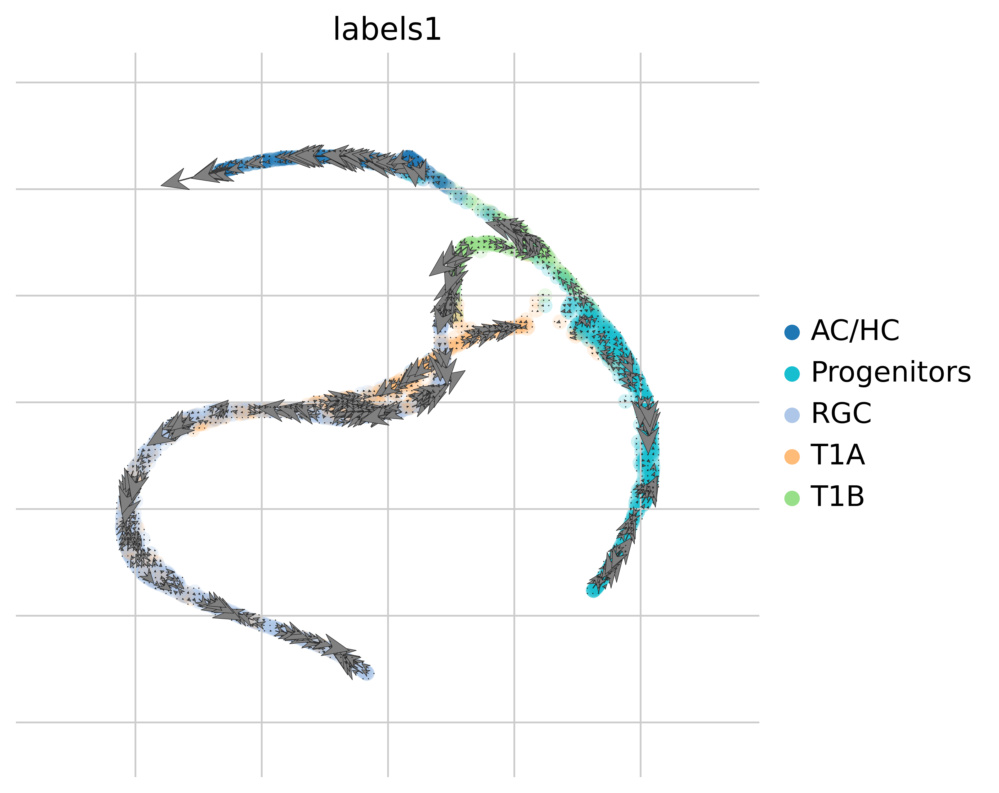

In [112]:
scv.pl.velocity_embedding_grid(FD59_loom, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, figsize = (6,6), arrow_length = 4, arrow_size = 6, density = 2, legend_loc = 'right')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


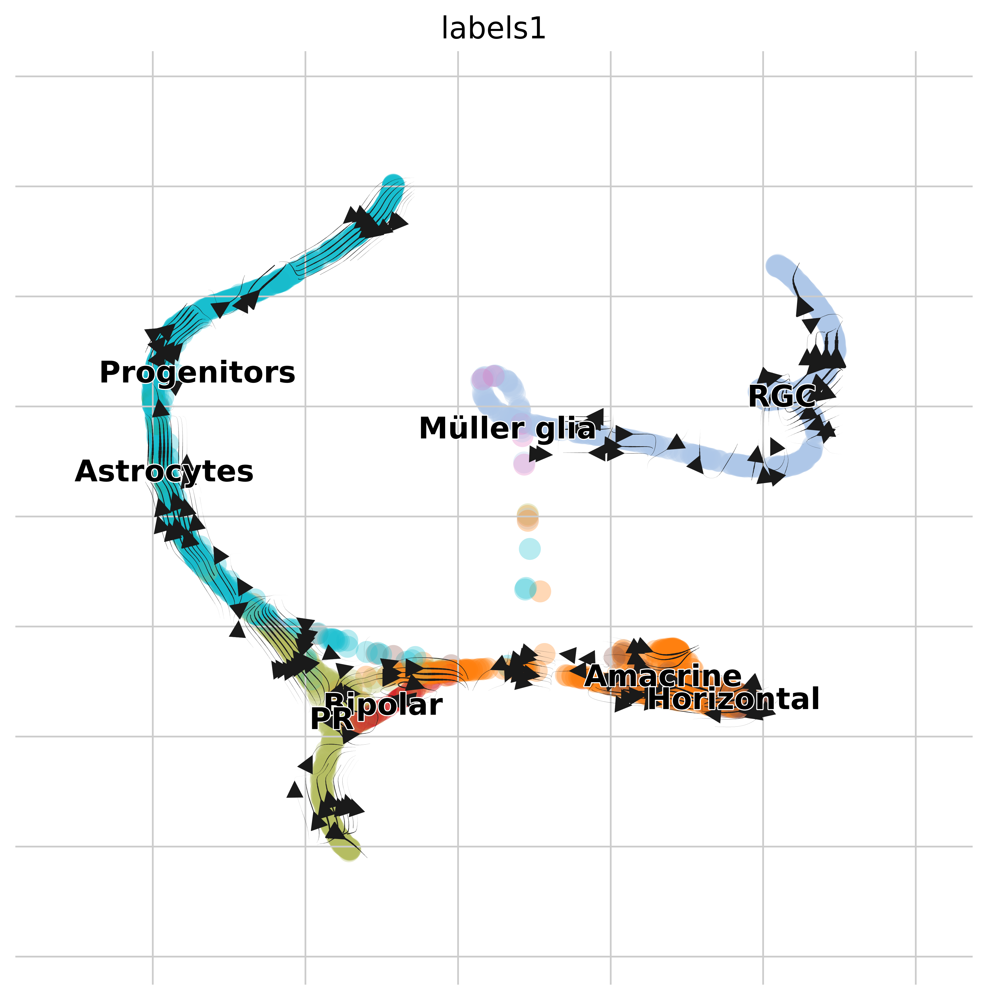

In [110]:
scv.pl.velocity_embedding_stream(FD82_loom, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

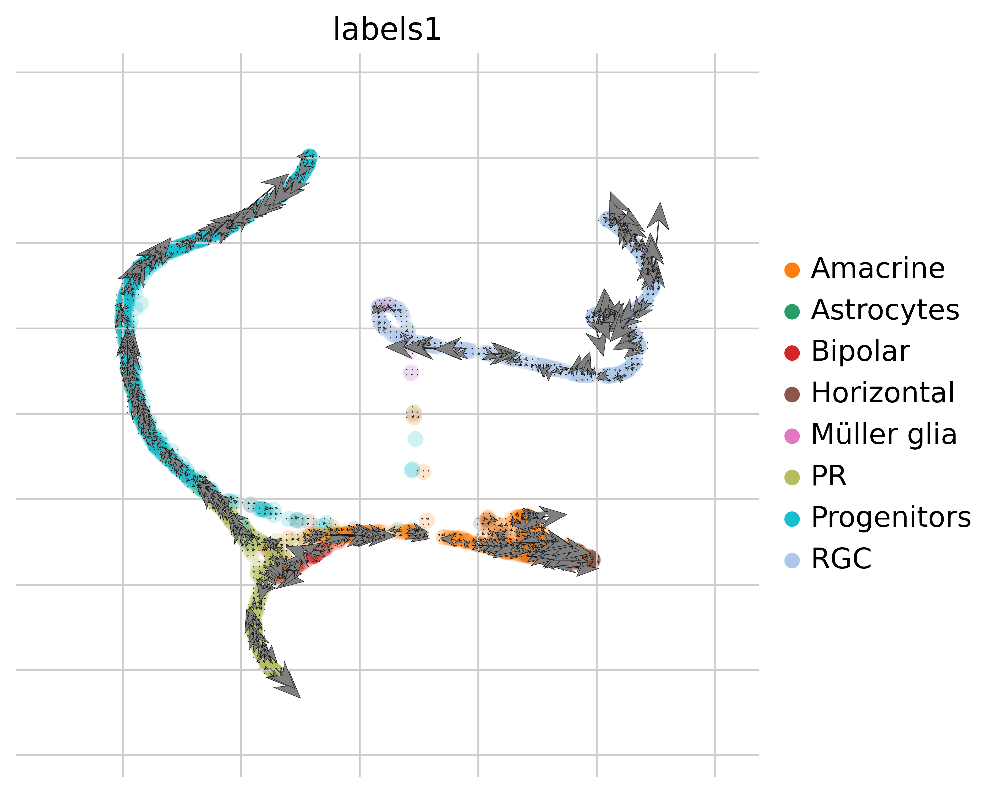

In [113]:
scv.pl.velocity_embedding_grid(FD82_loom, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, figsize = (6,6), arrow_length = 4, arrow_size = 6, density = 2, legend_loc = 'right')

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_draw_graph_fa', embedded velocity vectors (adata.obsm)


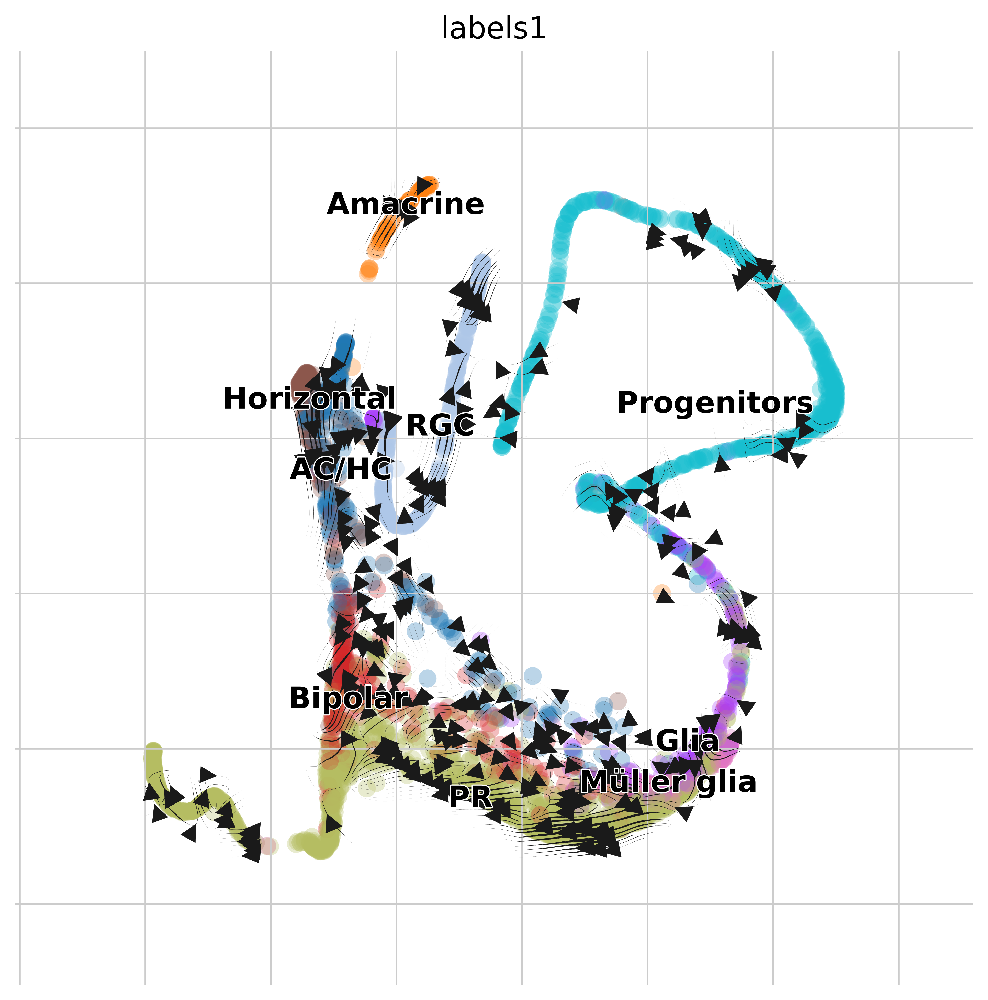

In [111]:
scv.pl.velocity_embedding_stream(FD125_loom, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, figsize = (8,8), arrow_size = 2, density = 6)

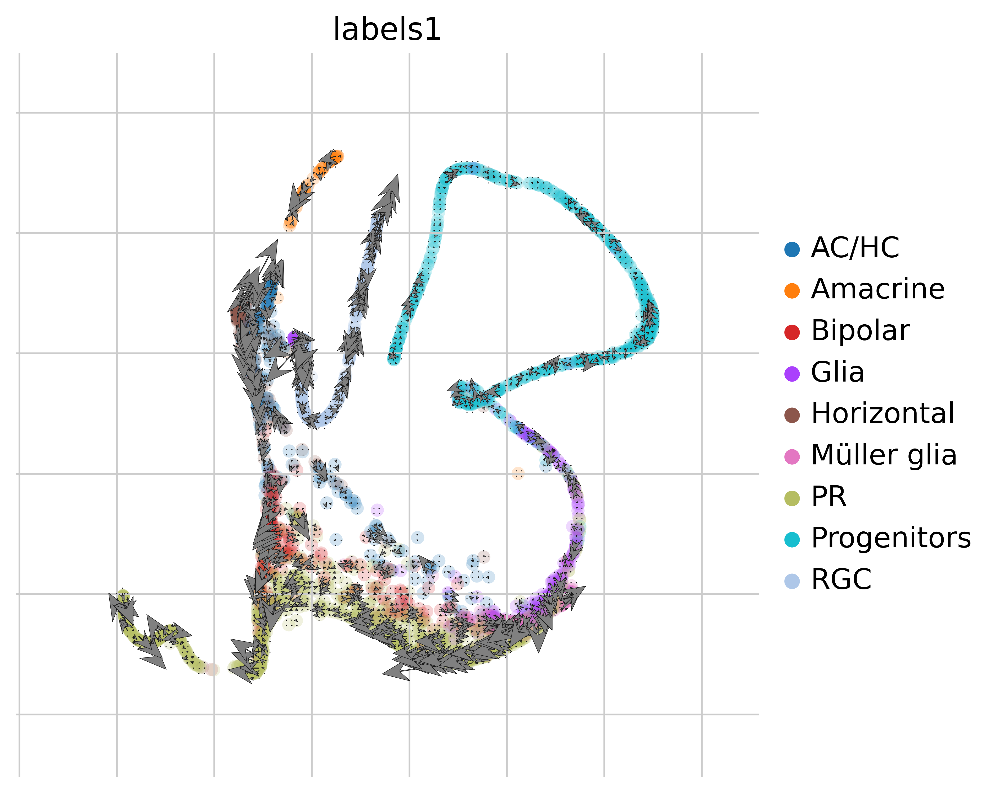

In [114]:
scv.pl.velocity_embedding_grid(FD125_loom, basis='draw_graph_fa', color = 'labels1', dpi = 300, add_margin = 0.2, figsize = (6,6), arrow_length = 4, arrow_size = 6, density = 2, legend_loc = 'right')